# Sorting lines based on the xml files

In [ ]:
simstrimg   # matching
pysimstrimg 

unidecod

In [1]:
!ls ../../edspdf-train/data/publaynet/

dev.json xmls     xmls.zip


In [1]:
base_dir = '../../edspdf-train/data/publaynet/'

In [2]:
%load_ext autoreload
%autoreload 2

import sys
sys.executable

'/Users/souleymbaye/opt/anaconda3/envs/eds_env/bin/python'

## Model extractor

In [3]:
from edspdf import Pipeline

model = Pipeline()
model.add_pipe("pdfminer-extractor", config=dict(extract_style="true"), name="extractor")

In [4]:
!ls ../../edspdf-train/data/publaynet/xmls | head -n +5

PMC1087887
PMC1087888
PMC1241820
PMC1247186
PMC1247188


## Visualize a pdf and xml

## XPath

In [20]:
!pip install Unidecode
!pip install fuzzysearch

In [19]:
!pip install elementpath
!pip install lxml 
!pip install graphviz
!pip install pydotplus

In [5]:
import io
import pydotplus
import elementpath
from lxml import etree
from copy import deepcopy
from graphviz import Source
from IPython.display import display, Image

### Fonctions d'affichage

In [6]:
xslt_dir = '../../edspdf-train/data/xslt/'

In [27]:

def printXML(element):
    # print(isinstance(element, etree._ElementTree))
    t = element if isinstance(element, etree._ElementTree) else etree.ElementTree(element)
    # t=etree.ElementTree(element)
    str=etree.tostring(t, pretty_print=True, encoding='unicode')
    print(str)
    # return str
 
        
def printXPath(xmltree,xp):
    # r=xmltree.xpath(xp)
    try:
        r=elementpath.select(xmltree,xp)
        print(f'Lenght {len(r)}')
        for x in r:
            printXML(x)
    except:
        print(f"error in expression ({xp}) or inputfile")
        

def displayXPath(xmltree,xp,pngfile="reponse"):
    # r=xmltree.xpath(xp)
    r=elementpath.select(xmltree,xp)
    reponse=etree.Element("reponse")
    for x in r:
        reponse.append(deepcopy(x))
    displayXMLInline(reponse)

    
def displayXML(t,pngfile="xpath"):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=transform(t)
    try:
        s=Source(str(s_dot),filename="gendata/"+pngfile+".dot", format="png")
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    s.view()
    
def displayXMLInline(t):
    f_xslt = open(f"{xslt_dir}xml2dot.xslt","r")
    xslt=etree.parse(f_xslt)
    transform = etree.XSLT(xslt)
    s_dot=str(transform(t))
    # print(s_dot)
    # with io.StringIO(s_dot) as f:
    #    a=nx.nx_pydot.read_dot(f)
    try:
        dg = pydotplus.graph_from_dot_data(s_dot)
        png = dg.create_png()
        display(Image(png))
    except:
        print("install graphviz")
        print(etree.tostring(t, pretty_print=True, encoding='unicode'))
    # print(s_dot)
    # return s_dot

In [8]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [9]:
from pathlib import Path

def get_paths(file_dir):

    file_dir = Path(file_dir)
    xml_path = next(file_dir.glob("*.nxml"))
    pdf_path = next(file_dir.glob("*.pdf"))
    
    return pdf_path, xml_path


### Example 1

In [37]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1087887/

1477-9560-3-5-1.gif 1477-9560-3-5-1.jpg 1477-9560-3-5.nxml  1477-9560-3-5.pdf


In [12]:
# file_dir = base_dir + 'xmls/PMC1087887'
# pdf_path, xml_path = get_paths(file_dir = file_dir)
# print(f'xml path: {xml_path}\npdf path: {pdf_path}')


#### Show annotations

In [10]:
# from edspdf.structures import Box, PDFDoc
# from edspdf.visualization.annotations import show_annotations

# # Read PDF
# pdf = pdf_path.read_bytes()
# doc: PDFDoc = model.get_pipe("extractor")(pdf)

# # pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [11]:
# Read XML
# xml = open(xml_path, 'rb')
# tree = etree.parse(xml)

# displayXMLInline(tree)

### Example 2

In [13]:
!ls ../../edspdf-train/data/publaynet/xmls/PMC1247188/

ehp0112-000959.nxml  ehp0112-000959f1.jpg ehp0112-000959f3.gif
ehp0112-000959.pdf   ehp0112-000959f2.gif ehp0112-000959f3.jpg
ehp0112-000959f1.gif ehp0112-000959f2.jpg


In [14]:
file_dir = base_dir + 'xmls/PMC1247188'
pdf_path, xml_path = get_paths(file_dir = file_dir)
print(f'xml path: {xml_path}\npdf path: {pdf_path}')


xml path: ../../edspdf-train/data/publaynet/xmls/PMC1247188/ehp0112-000959.nxml
pdf path: ../../edspdf-train/data/publaynet/xmls/PMC1247188/ehp0112-000959.pdf


#### Show annotations

In [15]:
from edspdf.structures import Box, PDFDoc
from edspdf.visualization.annotations import show_annotations

# Read PDF
pdf = pdf_path.read_bytes()
doc: PDFDoc = model.get_pipe("extractor")(pdf)

# pages = [page for page in show_annotations(doc.content, doc.content_lines)]
# for page in show_annotations(doc.content, doc.content_boxes):
#     display(page)

#### Display XML

In [16]:
# Read XML
xml = open(xml_path, 'rb')
tree = etree.parse(xml)
# root = tree.getroot()

printXML(tree)

<!DOCTYPE article PUBLIC "-//NLM//DTD JATS (Z39.96) Journal Archiving and Interchange DTD v1.0 20120330//EN" "JATS-archivearticle1.dtd">
<article xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML" article-type="research-article">
  <?properties open_access?>
  <front>
    <journal-meta>
      <journal-id journal-id-type="nlm-ta">Environ Health Perspect</journal-id>
      <journal-id journal-id-type="iso-abbrev">Environ. Health Perspect</journal-id>
      <journal-title-group>
        <journal-title>Environmental Health Perspectives</journal-title>
      </journal-title-group>
      <issn pub-type="ppub">0091-6765</issn>
      <issn pub-type="epub">1552-9924</issn>
      <publisher>
        <publisher-name>National Institue of Environmental Health Sciences</publisher-name>
      </publisher>
    </journal-meta>
    <article-meta>
      <article-id pub-id-type="pmid">15198915</article-id>
      <article-id pub-id-type="pmc">1247188</article-id>
    

In [41]:
[1,2,3,4,5][-1::-1]

[5, 4, 3, 2, 1]

In [58]:
qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff'
qbody='//body//title | //body//p'
printXPath(tree,qbody)


Lenght 69
<p xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:mml="http://www.w3.org/1998/Math/MathML">In populations not industrially exposed to polychlorinated dibenzo-<italic>p</italic>-dioxins and dibenzofurans (PCDD/Fs), diet is responsible for virtually all (~ 98%) human exposure to these compounds (<xref ref-type="bibr" rid="b40-ehp0112-000959">Pohl et al. 1995</xref>; <xref ref-type="bibr" rid="b51-ehp0112-000959">Travis and Hattemer-Frey 1987</xref>). PCDD/Fs are common contaminants in municipal sewage sludge; thus, it is important to consider the risk of increased exposure to these contaminants if sewage sludge is to be applied to agricultural lands. There is currently much interest in agricultural use of sewage sludge to reap its benefits as fertilizer, as an aid in moisture retention, and to provide an alternative to incineration or landfills for disposal. The term “sewage sludge” is used here to refer to the solid by-product of municipal sewage or wastewater treatment proc

In [27]:
# tous les textes
q0='//*/title | //*/p'
qfront='//*/front/title | //*/front/p'
qbody='//*/body/title | //*/body/p'
printXPath(tree,q0)

try:
    r=elementpath.select(tree, q0)
    for i,x in enumerate(r):
        if i==4:
            p5 = x
        print(i, ':', "".join(x.itertext()))
        # printXML(x)
except:
    print(f"error in expression ({q0}) or inputfile")

0 : The authors are grateful for the thoughtful review of drafts of this article by the BC Ministry of Water, Land and Air Protection, the BC Ministries of Health, and the Greater Vancouver Regional District.
1 : Funding was provided by the BC Ministry of Water, Land and Air Protection and Environment Canada.
2 : The authors declare they have no competing financial interests.
3 : Sewage sludge from municipal wastewater treatment is used in agriculture as a nutrient source and to aid in moisture retention. To examine the potential impact of sludge-amended soil on exposures to polychlorinated dibenzo-p-dioxins and dibenzofurans (PCDD/Fs) from plant and animal foods, we conducted a review of published empirical data from international sources. Levels of PCDD/F in municipal sewage sludge ranged from 0.0005 to 8,300 pg toxic equivalents (TEQ)/g. Background levels in soil ranged from 0.003 to 186 pg TEQ/g. In sludge-amended soils, levels of PCDD/F ranged from 1.4 to 15 pg TEQ/g. Studies that

In [56]:
def getTextNodes(tree, q):
    
    # def node():
    r=elementpath.select(tree, q)
    for x in r:
        # print(i, ':', x.text)
        if x.text :
            yield x
        else:
            continue
    
    # return node

In [19]:
from fuzzysearch import find_near_matches
from unidecode import unidecode
from tqdm import tqdm

# mapped text boxes
for i,tb in enumerate(doc.content_boxes):
    tb.id = i # text box id
map_tboxes = {tb.id: tb for tb in doc.content_boxes}

print('Nb text boxes:',len(map_tboxes))

def get_matches(nodes, text_boxes, nmax=None):
    l_matches = []
    for node in nodes:
        node_matches = []
        source_text = "".join(node.itertext())
        end = False # end of the current node
        
        for tb in text_boxes:
            target_text = unidecode(tb.text)
            len_target_text = len(target_text)
            if len_target_text < 1: # text box that have no text
                continue
            
            pdmax = 0.2  if len_target_text<=20 else (\
                    0.15 if len_target_text<=40 else \
                    0.1)
            dmax = int(pdmax * len_target_text)
            
            #match
            tb_matches = find_near_matches(target_text, source_text, max_l_dist=dmax)
            if len(tb_matches) > 0: # node text matches with text box text
                node_matches.append((tb,tb_matches))
                
                if tb.id in map_tboxes: # debug
                    del(map_tboxes[tb.id])
            
            # end of node # problem just first tb.text = 'Canada' for evry node.text == 'Canada'
            # for m in tb_matches:
            #     if len(source_text) <= m.end :
            #         end = True
            #         break
            # if end:
            #     break
        l_matches.append((node, node_matches))
        
        # just nmax nodes
        if nmax is not None:
            nmax -=1
            if nmax < 0:
                break
        
    return l_matches

# q0='//*/title | //*/p'
# nodes = tqdm(getTextNodes(tree, q0), mininterval=1)
# l_matches = get_matches(nodes, doc.content_boxes)

"""
    k = 30
    l_matches = []
    for node in tqdm(getTextNodes(tree, q0), mininterval=1):

        # k -= 1
        # if k < 0:
        #     break
        
        # print(node.text)
        matches = []
        for tb in doc.content_boxes:
            target_text = unidecode(tb.text)
            
            len_tt = len(target_text)
            if len_tt<2:
                continue
            
            pdmax = 0.2  if len_tt<=20 else (\
                    0.15 if len_tt<=40 else \
                    0.1)
            dmax = int(pdmax * len_tt)
            
            #match
            source_text = "".join(node.itertext())
            match = find_near_matches(target_text, source_text, max_l_dist=dmax)
            if len(match) > 0:
                if tb.id in map_tboxes:
                    del(map_tboxes[tb.id])
                matches.append((tb,match))
            
            # end of node
            end = False
            for m in match:
                if len(source_text) <= m.end :
                    end = True
                    break
            if end:
                break
        
        l_matches.append((node, matches))
"""

Nb text boxes: 2618


'\n    k = 30\n    l_matches = []\n    for node in tqdm(getTextNodes(tree, q0), mininterval=1):\n\n        # k -= 1\n        # if k < 0:\n        #     break\n        \n        # print(node.text)\n        matches = []\n        for tb in doc.content_boxes:\n            target_text = unidecode(tb.text)\n            \n            len_tt = len(target_text)\n            if len_tt<2:\n                continue\n            \n            pdmax = 0.2  if len_tt<=20 else (                    0.15 if len_tt<=40 else                     0.1)\n            dmax = int(pdmax * len_tt)\n            \n            #match\n            source_text = "".join(node.itertext())\n            match = find_near_matches(target_text, source_text, max_l_dist=dmax)\n            if len(match) > 0:\n                if tb.id in map_tboxes:\n                    del(map_tboxes[tb.id])\n                matches.append((tb,match))\n            \n            # end of node\n            end = False\n            for m in match:\

#### Font, Body and tables text nodes

In [80]:
for tb in doc.content_boxes:
    tb.rank = None

In [81]:
# front 


qfront='//front//title-group/* | //front//p | //front//corresp | //front//aff'
front_nodes = tqdm(elementpath.select(tree, qfront), mininterval=1)
front_matches = get_matches(front_nodes, doc.content_boxes)

print(f'Nb nodes {len(front_matches)}')
for it, (node, matches) in enumerate(front_matches):
    print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
    for rank, (tb,matches_tb) in enumerate(matches):
        tb.rank = rank
        tb.color = "yellow"
        tb.bg_color = "black"
        # print(f'    page {tb.page_num} --{tb.text}-- \t{tb}\t{matches_tb}')
    
    # if it >= 3: break



100%|██████████| 9/9 [00:01<00:00,  8.77it/s]

Nb nodes 9
0 
    nb matches 98 || node tag: article-title || itertext: --Potential for Increased Human Foodborne Exposure to PCDD/F When Recycling Sewage Sludge on Agricultural Land--
1 
    nb matches 121 || node tag: aff || itertext: --1School of Occupational and Environmental Hygiene--
2 
    nb matches 148 || node tag: aff || itertext: --2Institute for Resources, Environment and Sustainability--
3 
    nb matches 93 || node tag: aff || itertext: --3Department of Health Care and Epidemiology, University of British Columbia, Vancouver, British Columbia, Canada--
4 
    nb matches 301 || node tag: corresp || itertext: --Address correspondence to K. Rideout, Institute for Resources, Environment and Sustainability, University of British Columbia, 2206 East Mall, Room 491, Vancouver, BC V6T 1Z3 Canada. Telephone: (604) 732-3571. Fax: (604) 822-9250. E-mail:
krideout@interchange.ubc.ca--
5 
    nb matches 83 || node tag: p || itertext: --The authors are grateful for the thoughtful review

In [83]:
# body 


qbody='//body//title | //body//p'
body_nodes = tqdm(elementpath.select(tree, qbody), mininterval=1)
body_matches = get_matches(body_nodes, doc.content_boxes)

print(f'Nb nodes {len(body_matches)}')
for it, (node, matches) in enumerate(body_matches):
    print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
    for rank, (tb,matches_tb) in enumerate(matches):
        tb.rank = rank
        tb.color = "black"
        tb.bg_color = "cyan"
        # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
    
    # if it >= 3: break

100%|██████████| 69/69 [00:10<00:00,  6.46it/s]

Nb nodes 69
0 
    nb matches 204 || node tag: p || itertext: --In populations not industrially exposed to polychlorinated dibenzo-p-dioxins and dibenzofurans (PCDD/Fs), diet is responsible for virtually all (~ 98%) human exposure to these compounds (Pohl et al. 1995; Travis and Hattemer-Frey 1987). PCDD/Fs are common contaminants in municipal sewage sludge; thus, it is important to consider the risk of increased exposure to these contaminants if sewage sludge is to be applied to agricultural lands. There is currently much interest in agricultural use of sewage sludge to reap its benefits as fertilizer, as an aid in moisture retention, and to provide an alternative to incineration or landfills for disposal. The term “sewage sludge” is used here to refer to the solid by-product of municipal sewage or wastewater treatment processes. It includes but is not limited to “biosolids,” a term that usually refers to a stabilized product that has been treated to reduce pathogen content and vector

In [89]:
# tables 
from copy import deepcopy

qtables='//table-wrap | //table-wrap'
qtable='//label | //caption | //th | //td | //fn'

tables=elementpath.select(tree, qtables)
ltables_matches = []

for table_tree in tables:
    table_nodes = elementpath.select(table_tree, qtable)
    
    # Merging label and caption
    label = None
    caption = None
    for ind,node in enumerate(table_nodes):
        if node.tag == 'label':
            label = (ind,node)
        if node.tag == 'caption':
            caption = (ind,node)
        if label is not None and caption is not None:
            lc = etree.Element('label_caption')
            lc.append(deepcopy(label[1]))
            lc.append(deepcopy(caption[1]))
            table_nodes[label[0]] = lc
            table_nodes = table_nodes[:caption[0]] + table_nodes[1+caption[0]:]
            break
    
    table_nodes = tqdm(table_nodes, mininterval=1)
    table_matches = get_matches(table_nodes, doc.content_boxes)
    ltables_matches.append(table_matches)
    
for ltab in ltables_matches:
    for it, (node, matches) in enumerate(ltab):
        print(f'{it} \n    nb matches {len(matches)} || node tag: {node.tag} || itertext: --{"".join(node.itertext())}--')
        tx = []
        for rank, (tb,matches_tb) in enumerate(matches):
            tb.rank = it # str(it) + '-' + str(rank)
            tb.color = "red"
            tb.bg_color = "white"
            tx.append(tb.text)
            
            # if tb.text == 'Canada':
            #     print(it, tb)
            # print(f'    page {tb.page_num} --{tb.text}-- \t{matches_tb}')
        print('    '," -|- ".join(tx))
        
        # if it >= 3: break

 85%|████████▌ | 217/254 [00:11<00:01, 19.54it/s]

#### Ranked text boxes

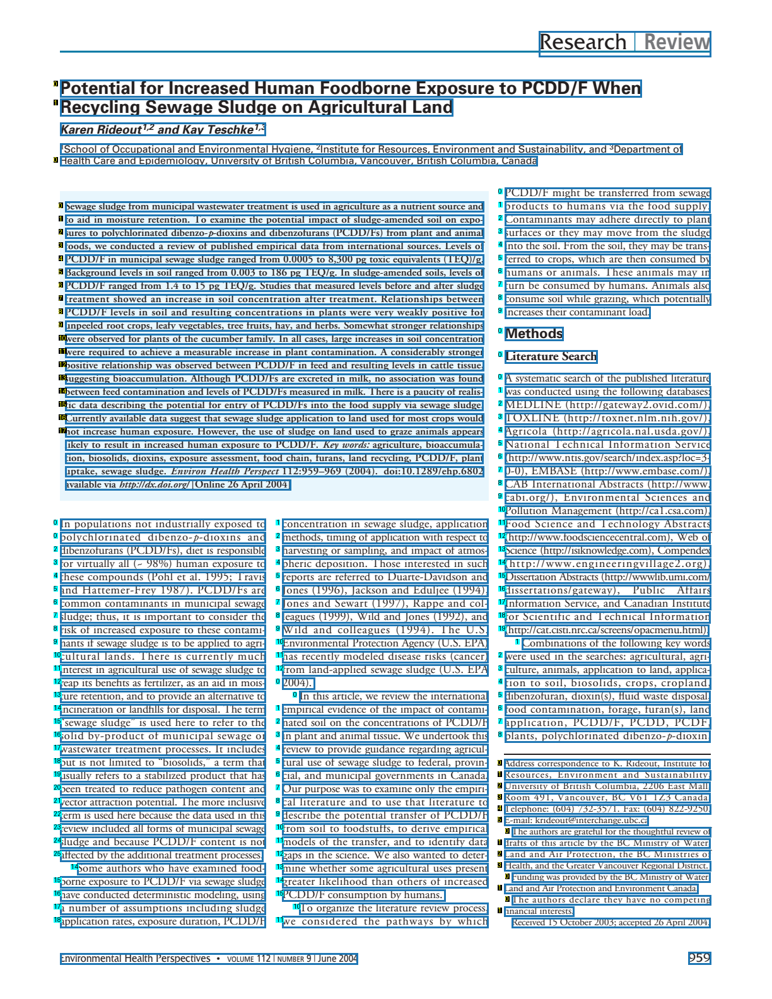

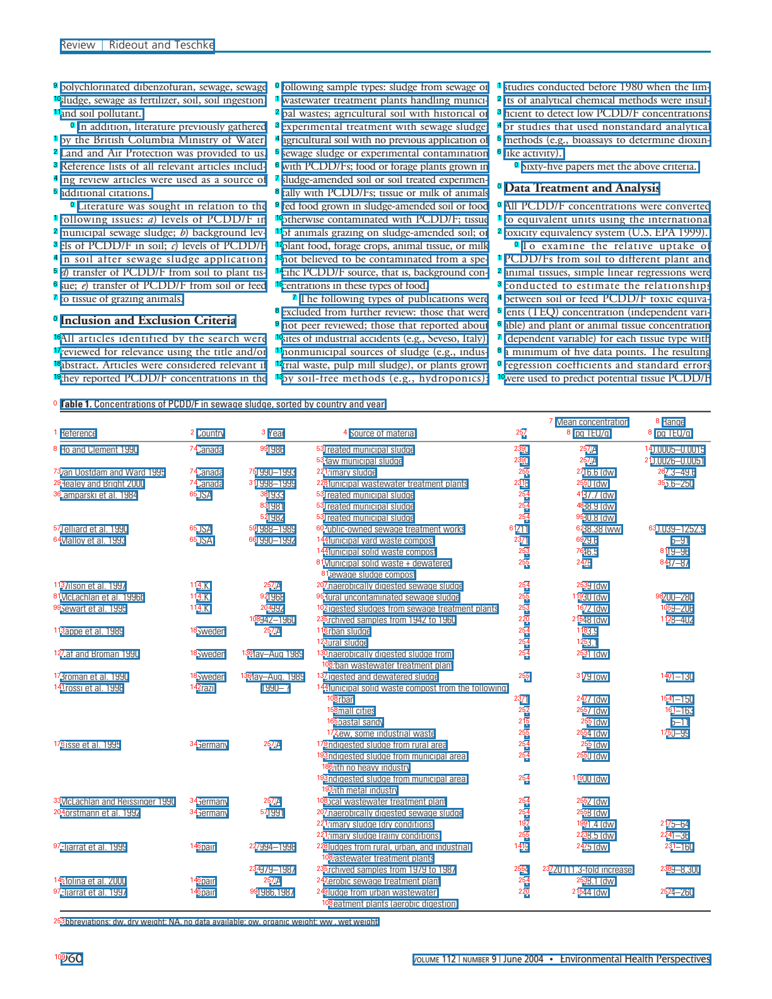

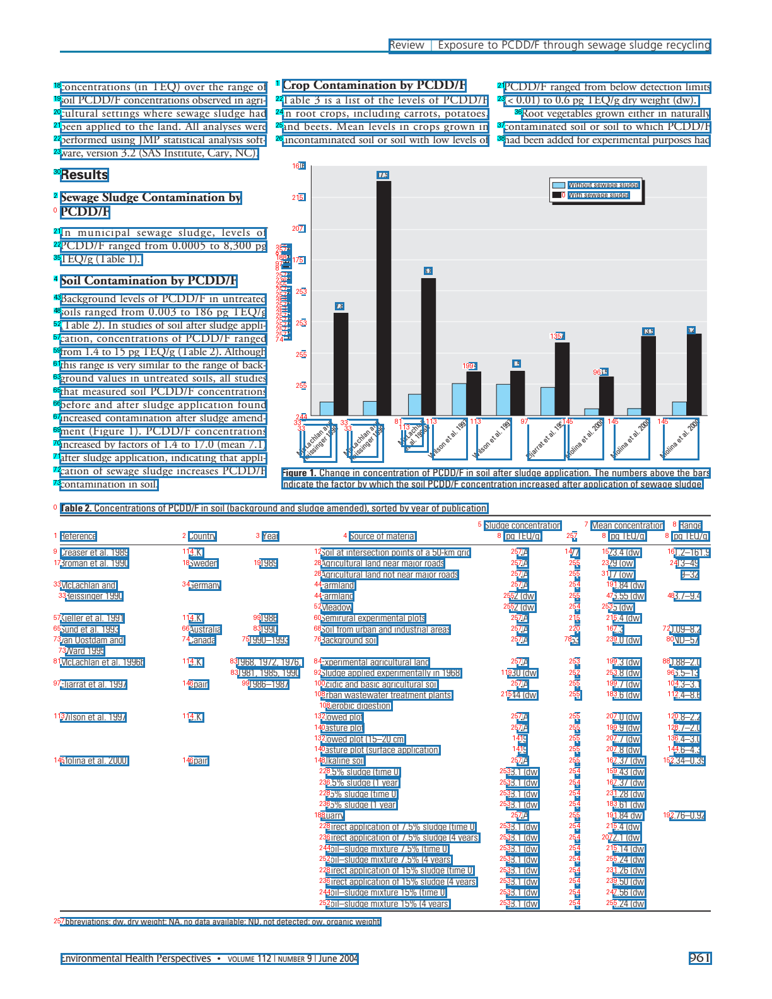

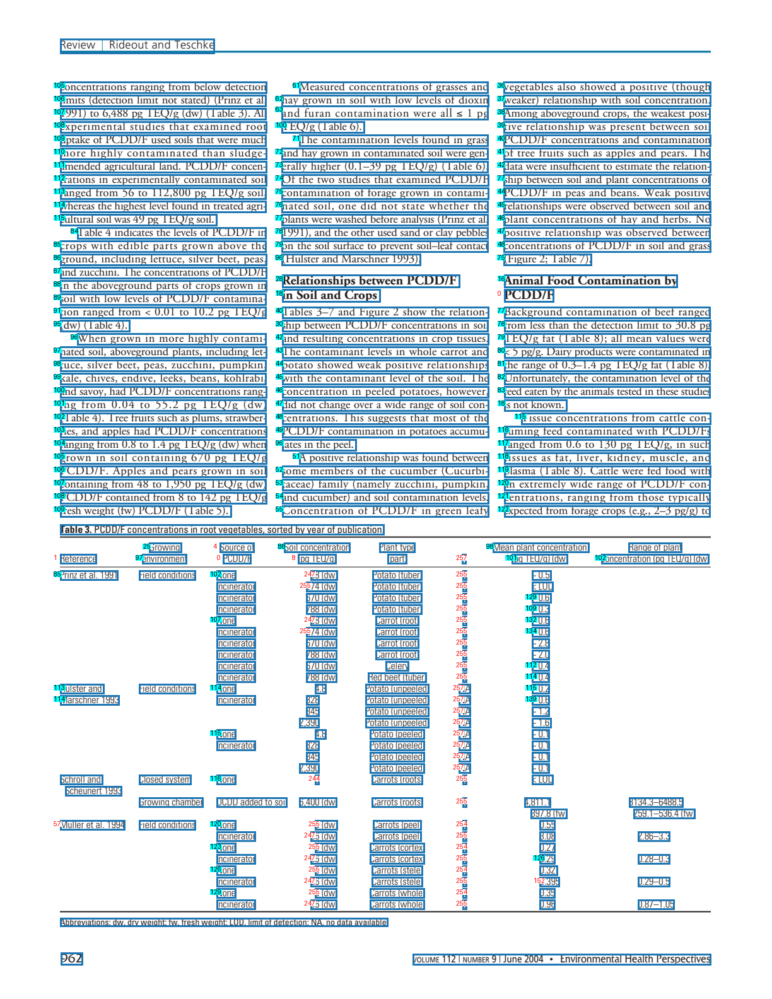

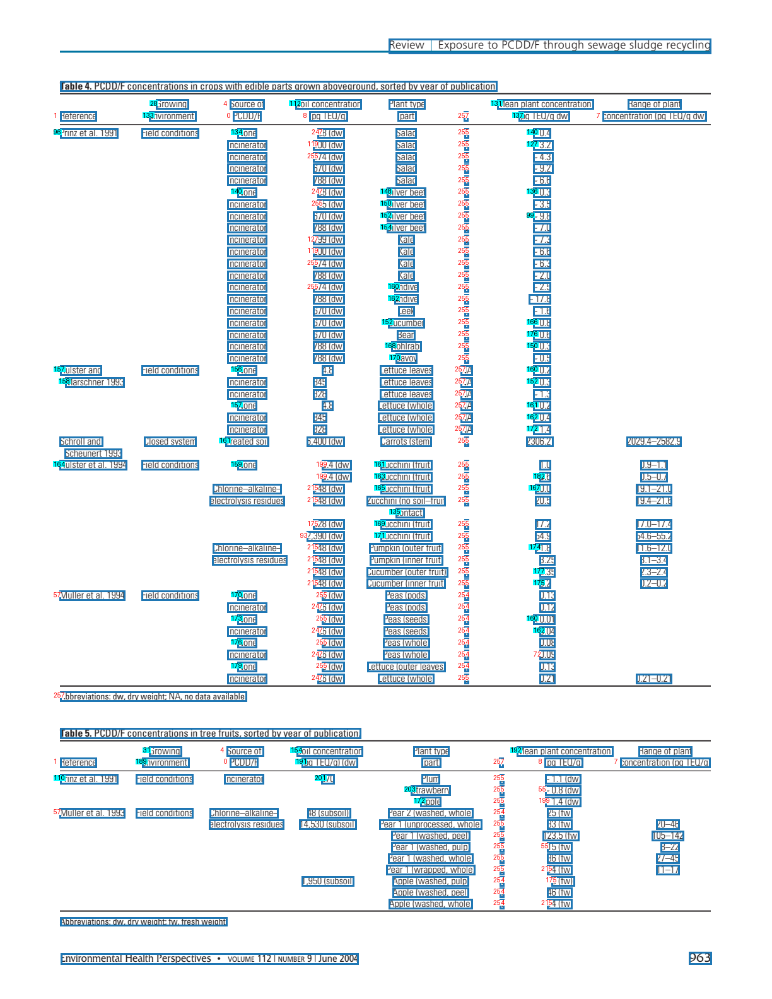

...

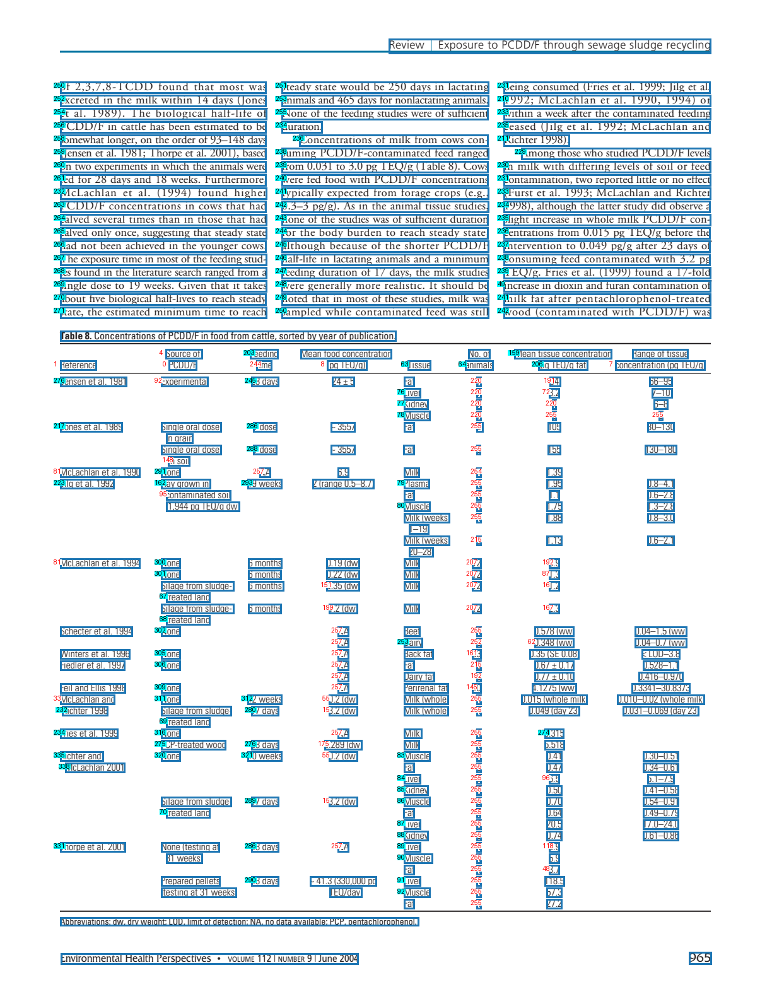

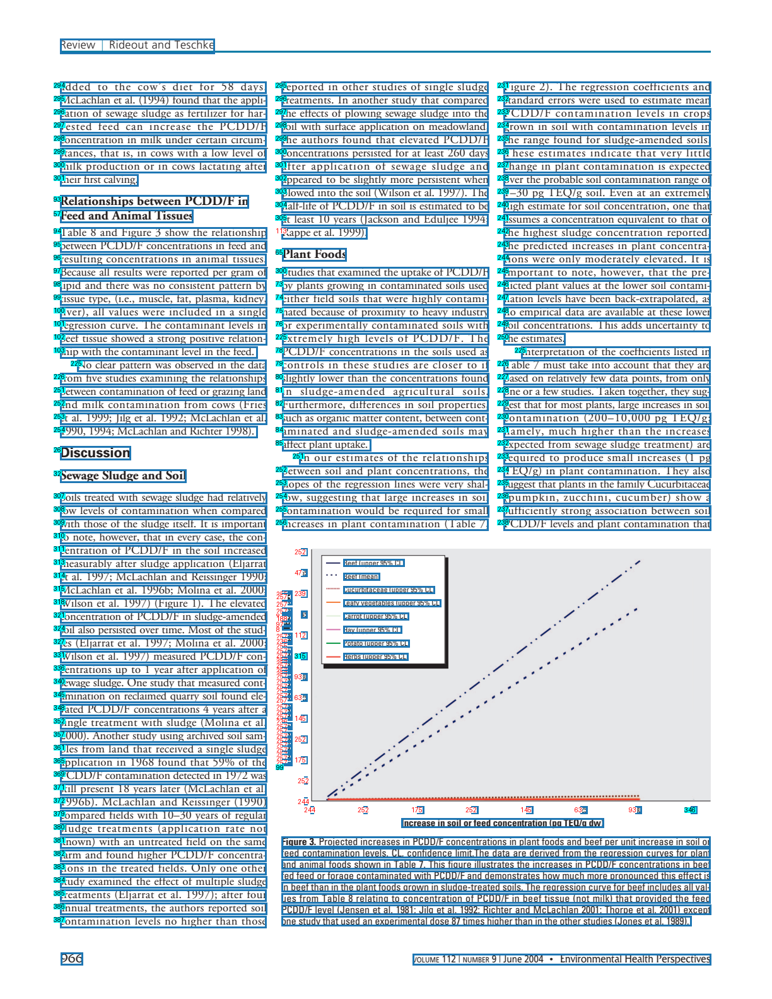

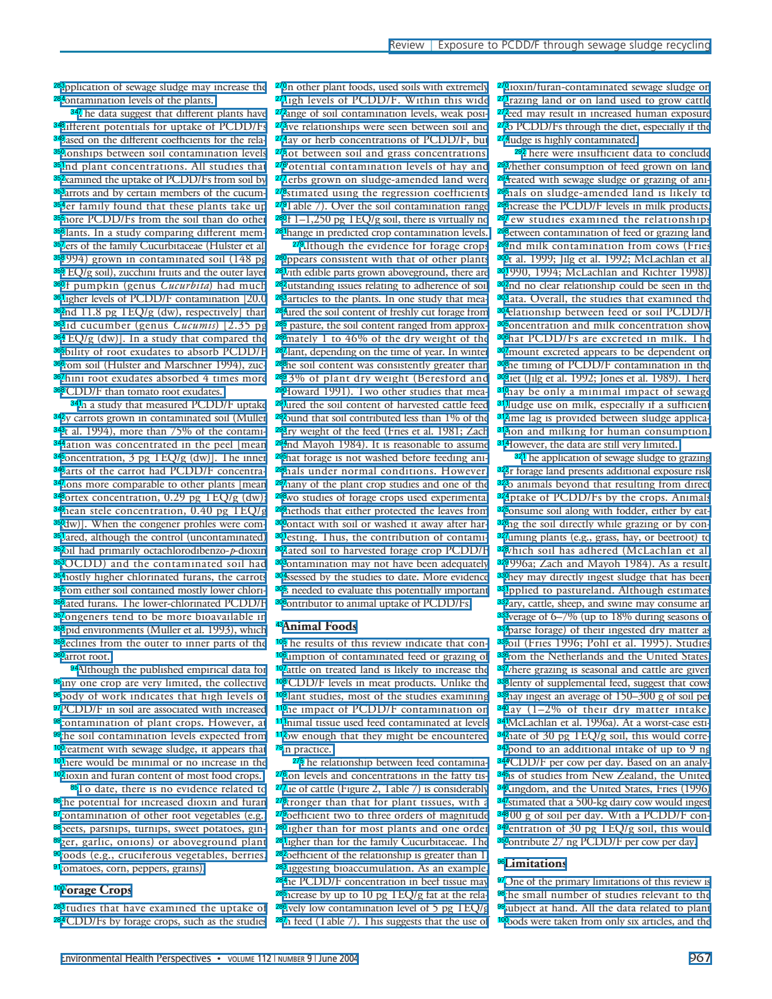

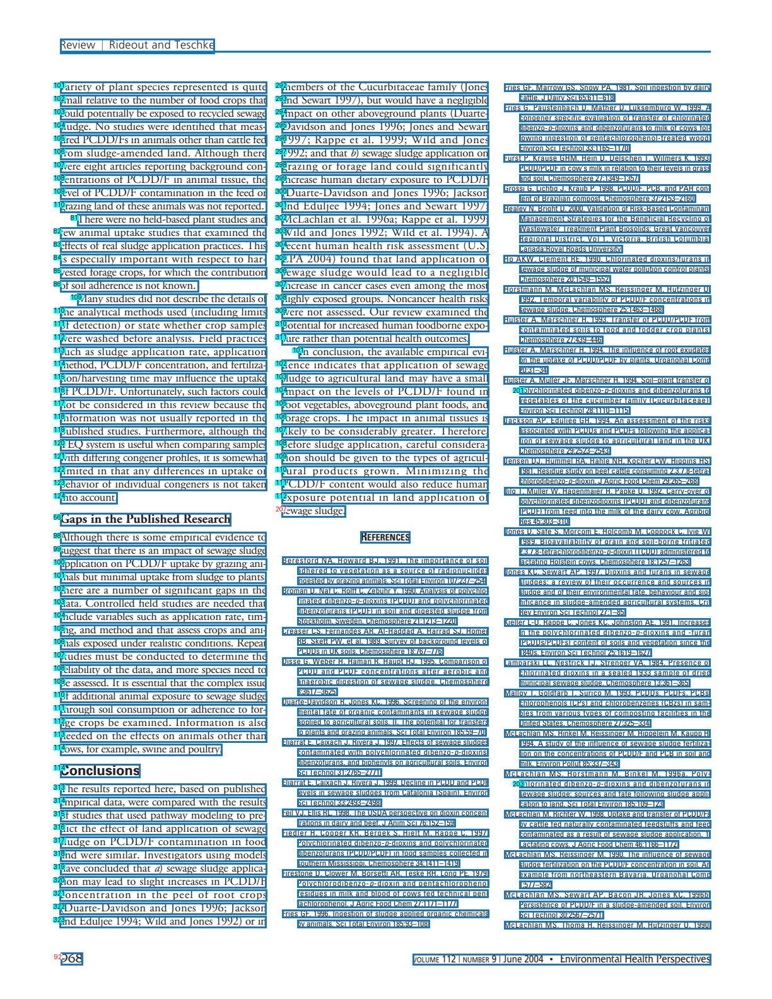

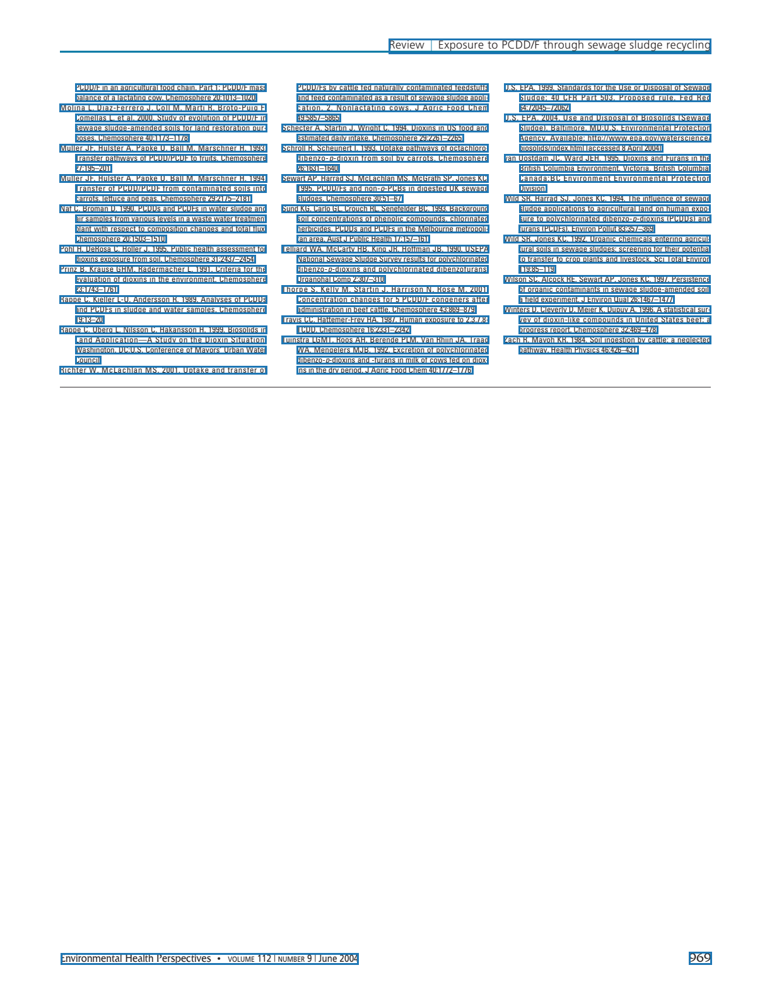

In [88]:
for page in show_annotations(doc.content, doc.content_boxes):
    display(page)

In [223]:
# debug table-wrap query


# tous les textes
qtables='//*/table-wrap | //*/table-wrap'
qtables_2='//*/label | //*/caption | //*/th | //*/td | //*/fn'
# printXPath(tree,qtables)

try:
    r=elementpath.select(tree, qtables)
    for i,x in enumerate(r):
        print(f'\nTable {i}\n')
        # printXML(x)
        print(f'type tree{type(tree)} <> type x {type(x)}')
        r2=elementpath.select(x, qtables_2)
        for i2,x2 in enumerate(r2):
            print(i2, ':', "".join(x2.itertext()))
        break # just one table
except:
    print(f"error in expression ({qtables}) ({qtables_2}) or inputfile")


Table 0

type tree<class 'lxml.etree._ElementTree'> <> type x <class 'lxml.etree._Element'>
0 : Table 1
1 : Concentrations of PCDD/F in sewage sludge, sorted by country and year.
2 : Reference
3 : Country
4 : Year
5 : Source of material
6 : n
7 : Mean concentration (pg TEQ/g)
8 : Range (pg TEQ/g)
9 : Ho and Clement 1990
10 : Canada
11 : 1986
12 : Treated municipal sludge
13 : 50
14 : NA
15 : 0.0005–0.0015
16 : 
17 : 
18 : 
19 : Raw municipal sludge
20 : 50
21 : NA
22 : 0.0026–0.0051
23 : van Oostdam and Ward 1995
24 : Canada
25 : 1990–1993
26 : Primary sludge
27 : 4
28 : 16.6 (dw)
29 : 2.3–49.6
30 : Healey and Bright 2000
31 : Canada
32 : 1998–1999
33 : Municipal wastewater treatment plants
34 : 26
35 : 40 (dw)
36 : 5.6–250
37 : Lamparski et al. 1984
38 : USA
39 : 1933
40 : Treated municipal sludge
41 : 1
42 : 87.7 (dw)
43 : 
44 : 
45 : 
46 : 1981
47 : Treated municipal sludge
48 : 1
49 : 88.9 (dw)
50 : 
51 : 
52 : 
53 : 1982
54 : Treated municipal sludge
55 : 1
56 : 80.8 (dw)
57 : 
5

In [212]:
# debug
# Not matched text boxes 


print(f'Nb text boxes not matched: {len(map_tboxes)}')

for tb in [v for _,v in map_tboxes.items()]:
    print(tb.page_num, f'{(tb.y0):.2f}', tb.text)

Nb text boxes not matched: 1331
0 0.03 Research | Review
0 0.08 Potential for Increased Human Foodborne Exposure to PCDD/F When
0 0.10 Recycling Sewage Sludge on Agricultural Land
0 0.12 Karen Rideout1,2 and Kay Teschke1,3
0 0.14 1School of Occupational and Environmental Hygiene, 2Institute for Resources, Environment and Sustainability, and 3Department of
0 0.16 Health Care and Epidemiology, University of British Columbia, Vancouver, British Columbia, Canada
0 0.44 likely to result in increased human exposure to PCDD/F. Key words: agriculture, bioaccumula-
0 0.45 tion, biosolids, dioxins, exposure assessment, food chain, furans, land recycling, PCDD/F, plant
0 0.47 uptake, sewage sludge. Environ Health Perspect 112:959–969 (2004). doi:10.1289/ehp.6802
0 0.48 available via http://dx.doi.org/ [Online 26 April 2004]
0 0.76 Address correspondence to K. Rideout, Institute for
0 0.77 Resources, Environment and Sustainability,
0 0.78 University of British Columbia, 2206 East Mall,
0 0.79 Room